In [ ]:
# from inpaint.data import *
# from inpaint.utils import *

In [ ]:
# !conda env list
# !pip install skimage

In [ ]:
# import os
# import cv2
# import numpy as np
# import torch
# # import imgcrop
# import random
# import math
# from PIL import Image, ImageDraw

# from torchvision import transforms
# from torch.utils.data import Dataset
# import torchvision
# # import utils
# from inpaint.utils import utils
# import matplotlib.pyplot as plt
# import matplotlib.image as mpimg
# from time import sleep
# from IPython.display import display # to display images


# ALLMASKTYPES = ['single_bbox', 'bbox', 'free_form']

# SEED = 1

# class InpaintDataset(Dataset):
#     def __init__(self, opt):
# #         assert opt.mask_type in ALLMASKTYPES
        
#         self.opt = opt
#         self.imglist = get_files(opt) #utils.

#     def __len__(self):
#         return len(self.imglist)

#     def __getitem__(self, index):
#         # image
#         global SEED
#         img = cv2.imread(self.imglist[index])
#         img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#         # set the different image size for each batch (data augmentation)
#         if index % self.opt.batch_size == 0:
#             SEED += 2
#         img, height, width = self.random_crop(img, SEED)
        
#         img = torch.from_numpy(img.astype(np.float32) / 255.0).permute(2, 0, 1).contiguous()
# #         mask = torch.from_numpy(mask.astype(np.float32)).contiguous()
# #         mask = self.random_mask()[0]
#         return img, height, width

#     def random_crop(self, img, seed):
#         width_list = [256, 320, 400, 480]
#         height_list = [256, 320, 400, 480]
#         random.seed(seed)
#         width = random.choice(width_list)
#         random.seed(seed+1)
#         height = random.choice(height_list)
        
#         max_x = img.shape[1] - width
#         max_y = img.shape[0] - height

#         x = np.random.randint(0, max_x)
#         y = np.random.randint(0, max_y)
        
#         crop = img[y: y + height, x: x + width]

#         return crop, height, width

#     @staticmethod
#     def random_ff_mask(shape, max_angle = 10, max_len = 40, max_width = 50, times = 15):
#         """Generate a random free form mask with configuration.
#         Args:
#             config: Config should have configuration including IMG_SHAPES,
#                 VERTICAL_MARGIN, HEIGHT, HORIZONTAL_MARGIN, WIDTH.
#         Returns:
#             tuple: (top, left, height, width)
#         """
#         height = shape[0]
#         width = shape[1]
#         mask = np.zeros((height, width), np.float32)
#         times = np.random.randint(times-5, times)
#         for i in range(times):
#             start_x = np.random.randint(width)
#             start_y = np.random.randint(height)
#             for j in range(1 + np.random.randint(5)):
#                 angle = 0.01 + np.random.randint(max_angle)
#                 if i % 2 == 0:
#                     angle = 2 * 3.1415926 - angle
#                 length = 10 + np.random.randint(max_len-20, max_len)
#                 brush_w = 5 + np.random.randint(max_width-30, max_width)
#                 end_x = (start_x + length * np.sin(angle)).astype(np.int32)
#                 end_y = (start_y + length * np.cos(angle)).astype(np.int32)
#                 cv2.line(mask, (start_y, start_x), (end_y, end_x), 1.0, brush_w)
#                 start_x, start_y = end_x, end_y
#         return mask.reshape((1, ) + mask.shape).astype(np.float32)
    
    
#     def random_bbox(self, shape, margin, bbox_shape):
#         """Generate a random tlhw with configuration.
#         Args:
#             config: Config should have configuration including IMG_SHAPES, VERTICAL_MARGIN, HEIGHT, HORIZONTAL_MARGIN, WIDTH.
#         Returns:
#             tuple: (top, left, height, width)
#         """
#         img_height = shape
#         img_width = shape
#         height = bbox_shape
#         width = bbox_shape
#         ver_margin = margin
#         hor_margin = margin
#         maxt = img_height - ver_margin - height
#         maxl = img_width - hor_margin - width
#         t = np.random.randint(low = ver_margin, high = maxt)
#         l = np.random.randint(low = hor_margin, high = maxl)
#         h = height
#         w = width
#         return (t, l, h, w)

#     def bbox2mask(self, shape, margin, bbox_shape, times):
#         """Generate mask tensor from bbox.
#         Args:
#             bbox: configuration tuple, (top, left, height, width)
#             config: Config should have configuration including IMG_SHAPES,
#                 MAX_DELTA_HEIGHT, MAX_DELTA_WIDTH.
#         Returns:
#             tf.Tensor: output with shape [1, H, W, 1]
#         """
#         bboxs = []
#         for i in range(times):
#             bbox = self.random_bbox(shape, margin, bbox_shape)
#             bboxs.append(bbox)
#         height = shape
#         width = shape
#         mask = np.zeros((height, width), np.float32)
#         for bbox in bboxs:
#             h = int(bbox[2] * 0.1) + np.random.randint(int(bbox[2] * 0.2 + 1))
#             w = int(bbox[3] * 0.1) + np.random.randint(int(bbox[3] * 0.2) + 1)
#             mask[(bbox[0] + h) : (bbox[0] + bbox[2] - h), (bbox[1] + w) : (bbox[1] + bbox[3] - w)] = 1.
#         return mask.reshape((1, ) + mask.shape).astype(np.float32)
    
#     def random_mask(self):
#         # rectangle mask
#         image_height = 256
#         image_width = 256
#         max_delta_height = 32
#         max_delta_width = 32
#         height = 128
#         width = 128
#         max_t = image_height - height
#         max_l = image_width - width
#         t = random.randint(0, max_t)
#         l = random.randint(0, max_l)
#         # bbox = (t, l, height, width)
#         h = random.randint(0, max_delta_height//2)
#         w = random.randint(0, max_delta_width//2)
#         mask = torch.zeros((1, 1, image_height, image_width))
#         mask[:, :, t+h:t+height-h, l+w:l+width-w] = 1
#         rect_mask = mask

#         # brush mask
#         min_num_vertex = 4
#         max_num_vertex = 12
#         mean_angle = 2 * math.pi / 5
#         angle_range = 2 * math.pi / 15
#         min_width = 12
#         max_width = 40
#         H, W = image_height, image_width
#         average_radius = math.sqrt(H*H+W*W) / 8
#         mask = Image.new('L', (W, H), 0)

#         for _ in range(np.random.randint(1, 4)):
#             num_vertex = np.random.randint(min_num_vertex, max_num_vertex)
#             angle_min = mean_angle - np.random.uniform(0, angle_range)
#             angle_max = mean_angle + np.random.uniform(0, angle_range)
#             angles = []
#             vertex = []
#             for i in range(num_vertex):
#                 if i % 2 == 0:
#                     angles.append(2*math.pi - np.random.uniform(angle_min, angle_max))
#                 else:
#                     angles.append(np.random.uniform(angle_min, angle_max))

#             h, w = mask.size
#             vertex.append((int(np.random.randint(0, w)), int(np.random.randint(0, h))))
#             for i in range(num_vertex):
#                 r = np.clip(
#                     np.random.normal(loc=average_radius, scale=average_radius//2),
#                     0, 2*average_radius)
#                 new_x = np.clip(vertex[-1][0] + r * math.cos(angles[i]), 0, w)
#                 new_y = np.clip(vertex[-1][1] + r * math.sin(angles[i]), 0, h)
#                 vertex.append((int(new_x), int(new_y)))

#             draw = ImageDraw.Draw(mask)
#             width = int(np.random.uniform(min_width, max_width))
#             draw.line(vertex, fill=255, width=width)
#             for v in vertex:
#                 draw.ellipse((v[0] - width//2,
#                               v[1] - width//2,
#                               v[0] + width//2,
#                               v[1] + width//2),
#                              fill=255)

#         if np.random.normal() > 0:
#             mask.transpose(Image.FLIP_LEFT_RIGHT)
#         if np.random.normal() > 0:
#             mask.transpose(Image.FLIP_TOP_BOTTOM)

#         mask = transforms.ToTensor()(mask)
#         mask = mask.reshape((1, 1, H, W))
#         brush_mask = mask

#         mask = torch.cat([rect_mask, brush_mask], dim=1).max(dim=1, keepdim=True)[0]
#         return mask
        
# class ValidationSet_with_Known_Mask(Dataset):
#     def __init__(self, opt):
#         self.opt = opt
#         self.namelist = utils.get_names(opt.baseroot)

#     def __len__(self):
#         return len(self.namelist)

#     def __getitem__(self, index):
#         # image
#         imgname = self.namelist[index]
#         imgpath = os.path.join(self.opt.baseroot, imgname)
#         img = cv2.imread(imgpath)
#         img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#         # mask
#         maskpath = os.path.join(self.opt.maskroot, imgname)
#         img = cv2.imread(maskpath, cv2.IMREAD_GRAYSCALE)
#         # the outputs are entire image and mask, respectively
#         img = torch.from_numpy(img.astype(np.float32) / 255.0).permute(2, 0, 1).contiguous()
#         mask = torch.from_numpy(mask.astype(np.float32)).unsqueeze(0).contiguous()
#         return img, mask, imgname
    
    

In [1]:
import sys

sys.argv = [""]
del sys

mask_shape =  (1, 512, 833)
image_toTensor shape =  torch.Size([3, 512, 833])
masked_img shape =  torch.Size([3, 512, 833])


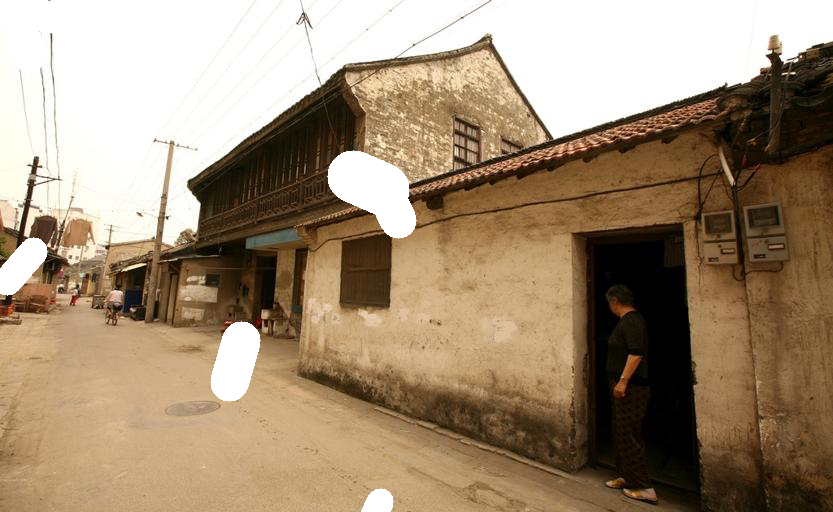

mask_shape =  (1, 512, 683)
image_toTensor shape =  torch.Size([3, 512, 683])
masked_img shape =  torch.Size([3, 512, 683])


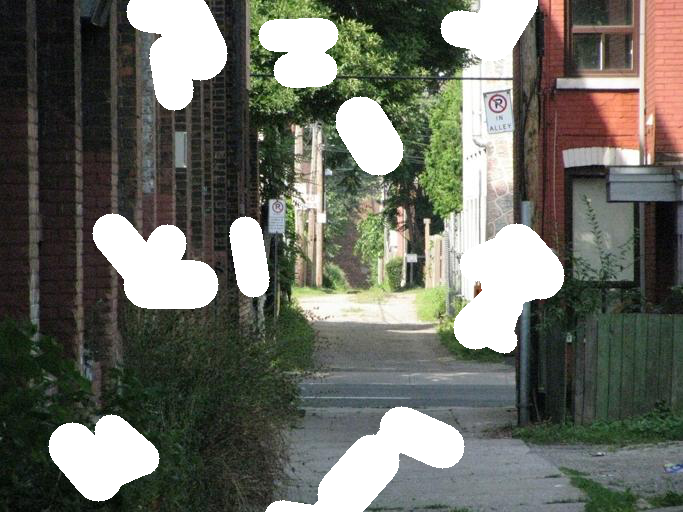

mask_shape =  (1, 512, 683)
image_toTensor shape =  torch.Size([3, 512, 683])
masked_img shape =  torch.Size([3, 512, 683])


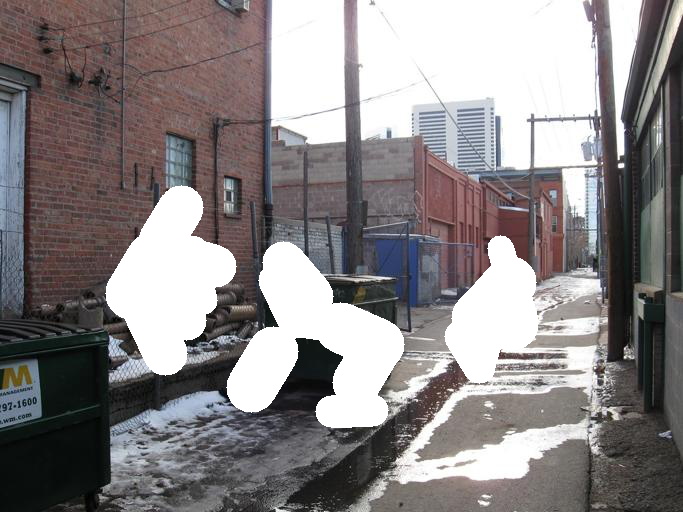

mask_shape =  (1, 512, 666)
image_toTensor shape =  torch.Size([3, 512, 666])
masked_img shape =  torch.Size([3, 512, 666])


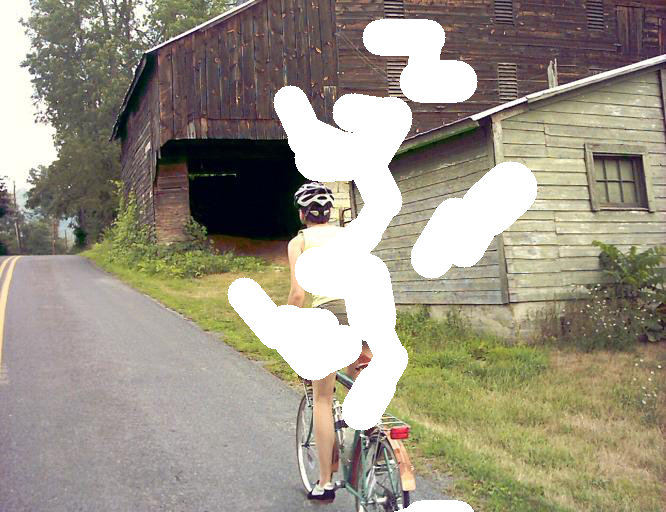

mask_shape =  (1, 512, 768)
image_toTensor shape =  torch.Size([3, 512, 768])
masked_img shape =  torch.Size([3, 512, 768])


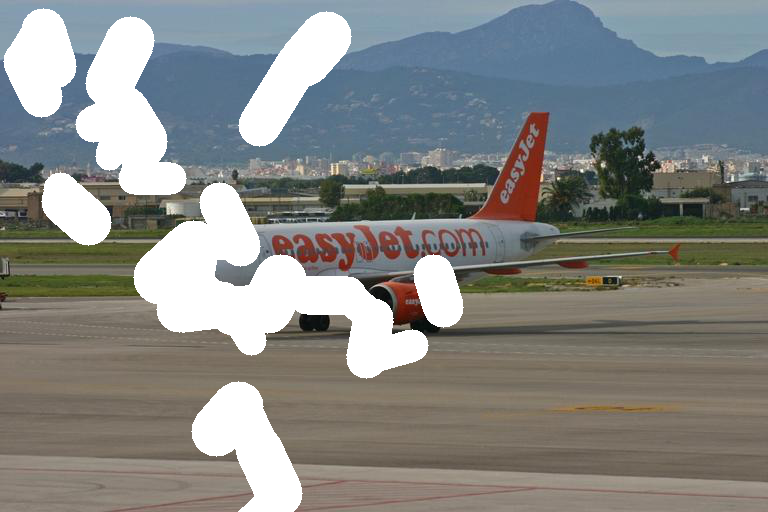

mask_shape =  (1, 512, 768)
image_toTensor shape =  torch.Size([3, 512, 768])
masked_img shape =  torch.Size([3, 512, 768])


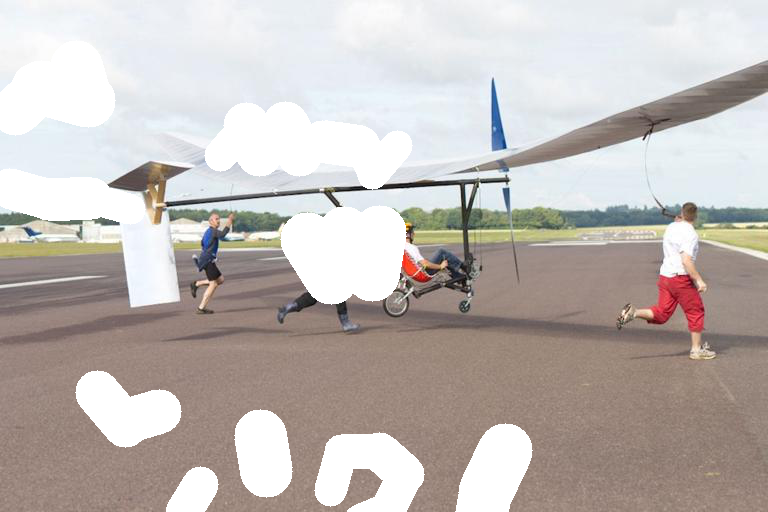

mask_shape =  (1, 512, 718)
image_toTensor shape =  torch.Size([3, 512, 718])
masked_img shape =  torch.Size([3, 512, 718])


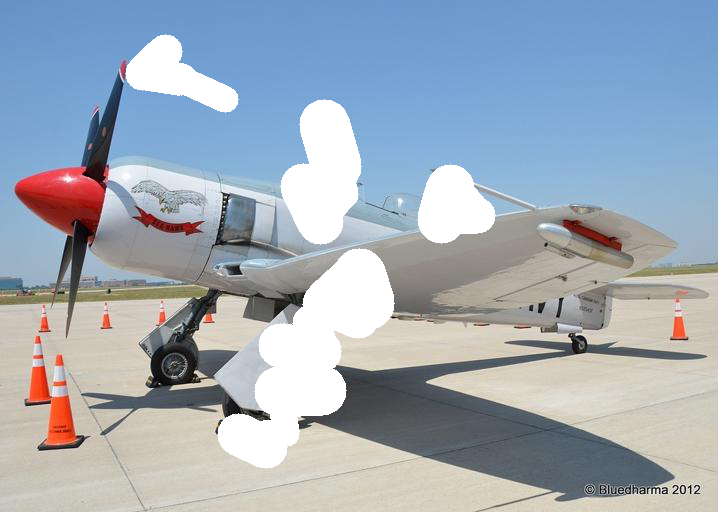

mask_shape =  (1, 512, 683)
image_toTensor shape =  torch.Size([3, 512, 683])
masked_img shape =  torch.Size([3, 512, 683])


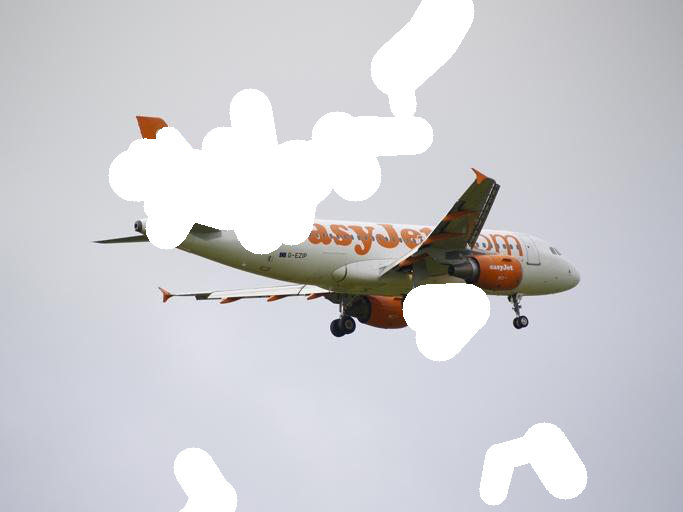

mask_shape =  (1, 512, 768)
image_toTensor shape =  torch.Size([3, 512, 768])
masked_img shape =  torch.Size([3, 512, 768])


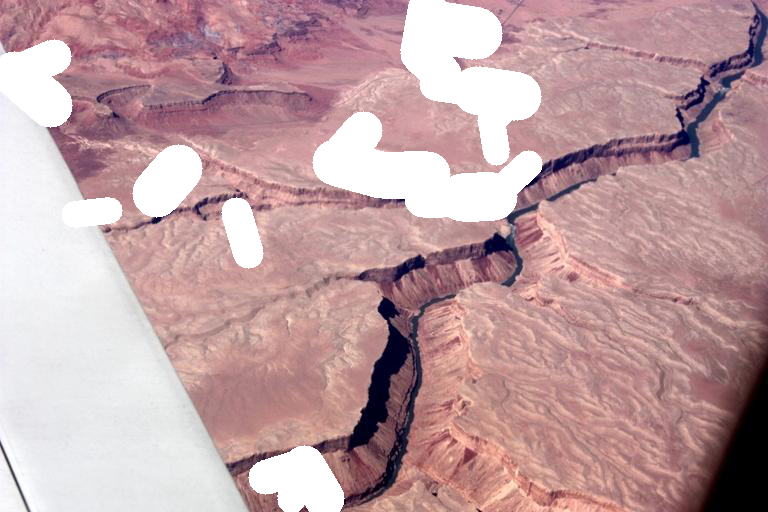

mask_shape =  (1, 512, 769)
image_toTensor shape =  torch.Size([3, 512, 769])
masked_img shape =  torch.Size([3, 512, 769])


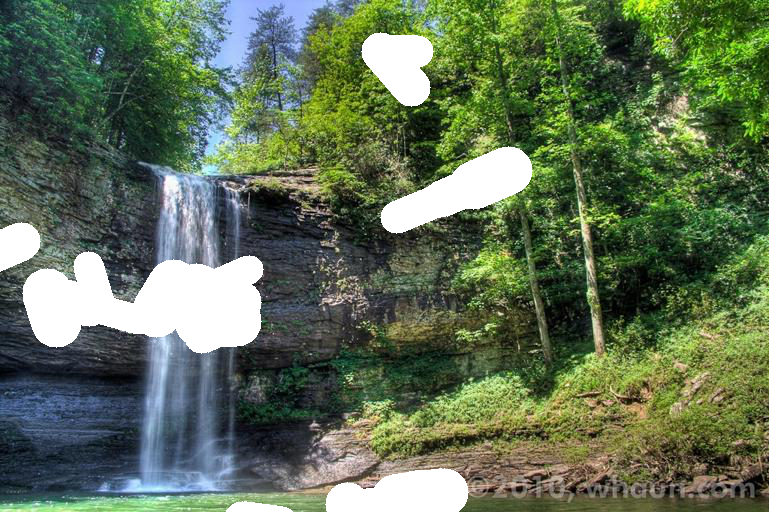

mask_shape =  (1, 774, 512)
image_toTensor shape =  torch.Size([3, 774, 512])
masked_img shape =  torch.Size([3, 774, 512])


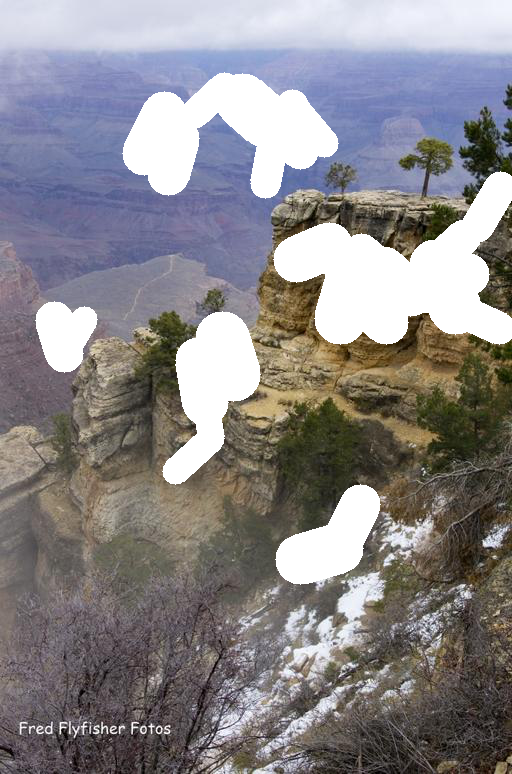

mask_shape =  (1, 512, 768)
image_toTensor shape =  torch.Size([3, 512, 768])
masked_img shape =  torch.Size([3, 512, 768])


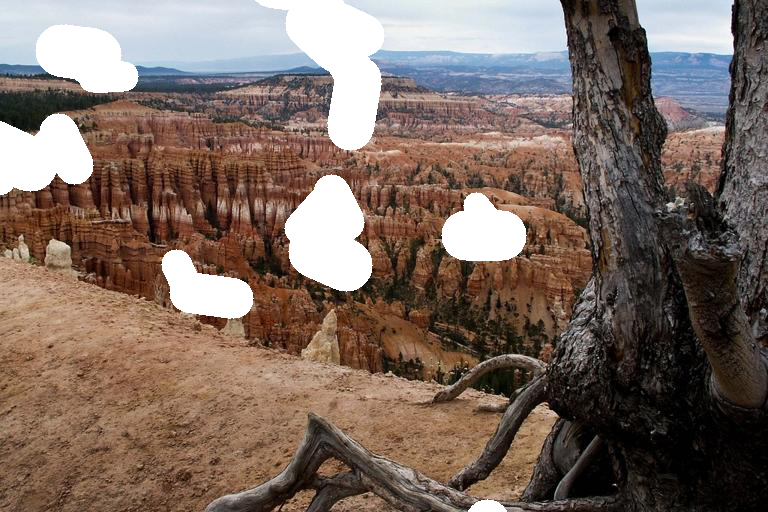

mask_shape =  (1, 768, 512)
image_toTensor shape =  torch.Size([3, 768, 512])
masked_img shape =  torch.Size([3, 768, 512])


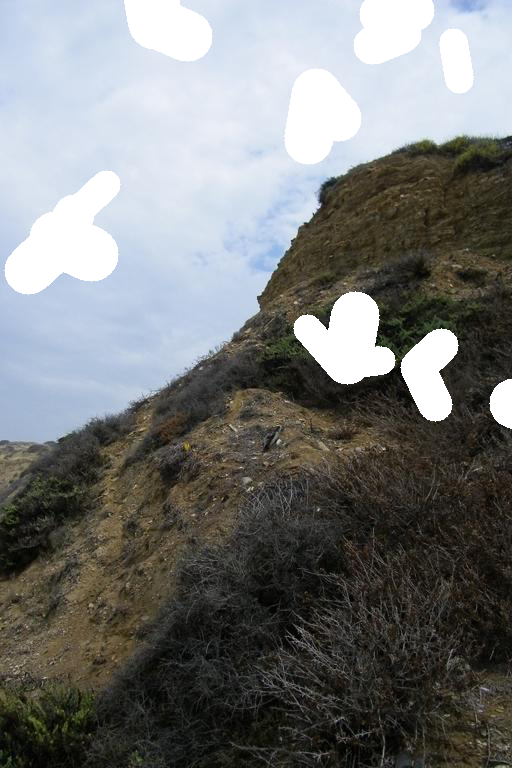

mask_shape =  (1, 512, 683)
image_toTensor shape =  torch.Size([3, 512, 683])
masked_img shape =  torch.Size([3, 512, 683])


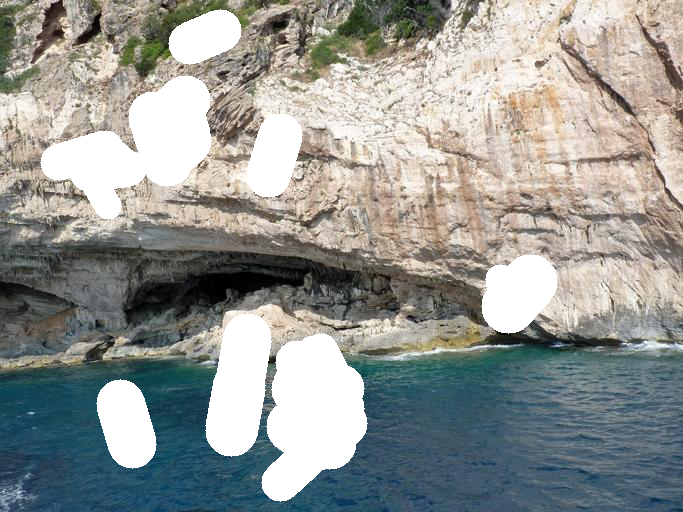

mask_shape =  (1, 512, 772)
image_toTensor shape =  torch.Size([3, 512, 772])
masked_img shape =  torch.Size([3, 512, 772])


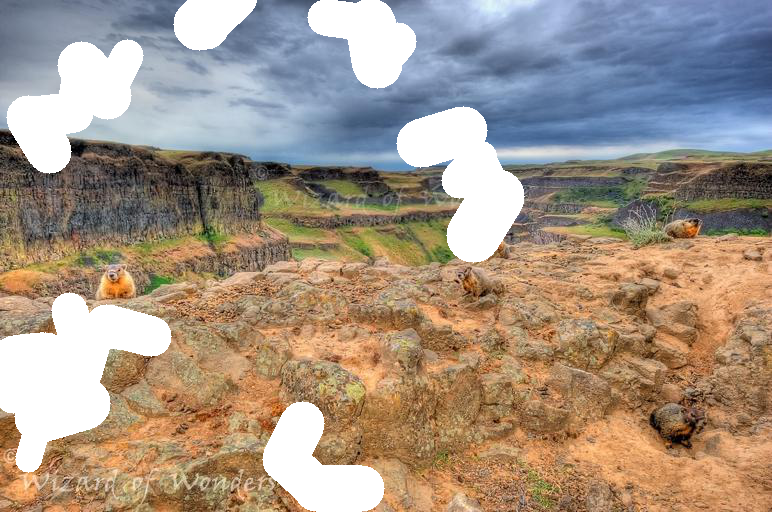

mask_shape =  (1, 512, 952)
image_toTensor shape =  torch.Size([3, 512, 952])
masked_img shape =  torch.Size([3, 512, 952])


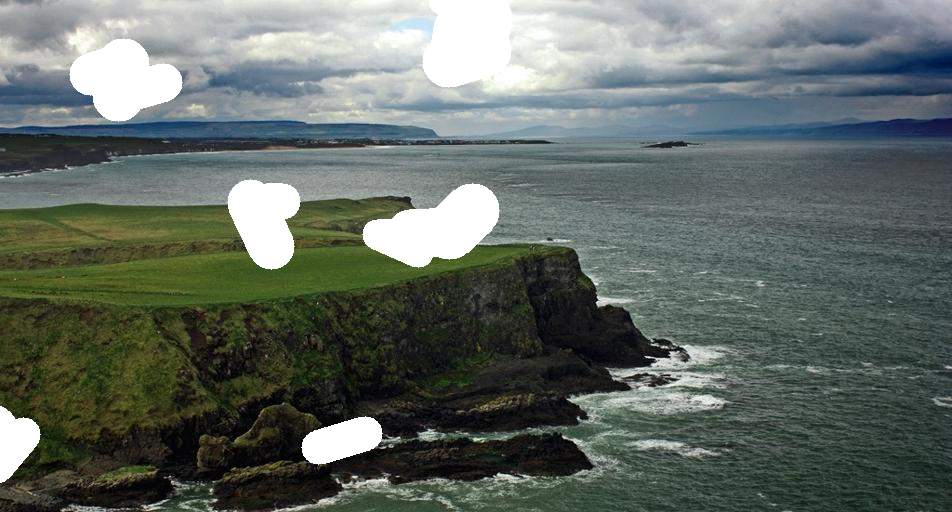

mask_shape =  (1, 512, 1290)
image_toTensor shape =  torch.Size([3, 512, 1290])
masked_img shape =  torch.Size([3, 512, 1290])


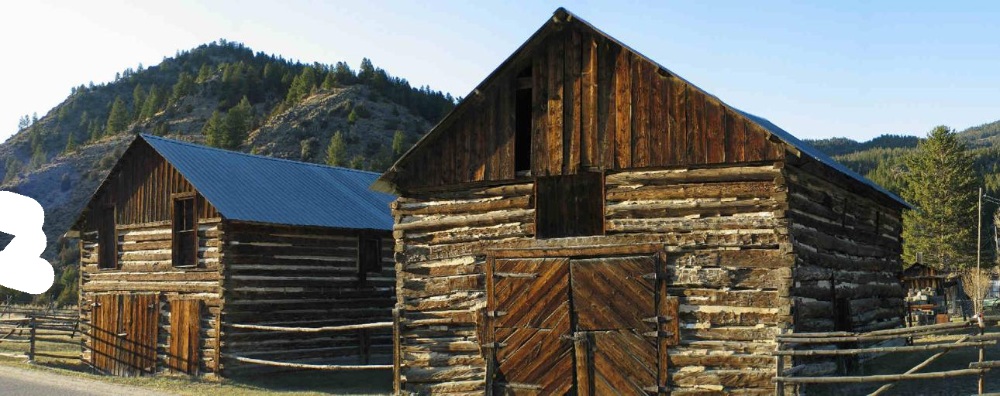

mask_shape =  (1, 512, 682)
image_toTensor shape =  torch.Size([3, 512, 682])
masked_img shape =  torch.Size([3, 512, 682])


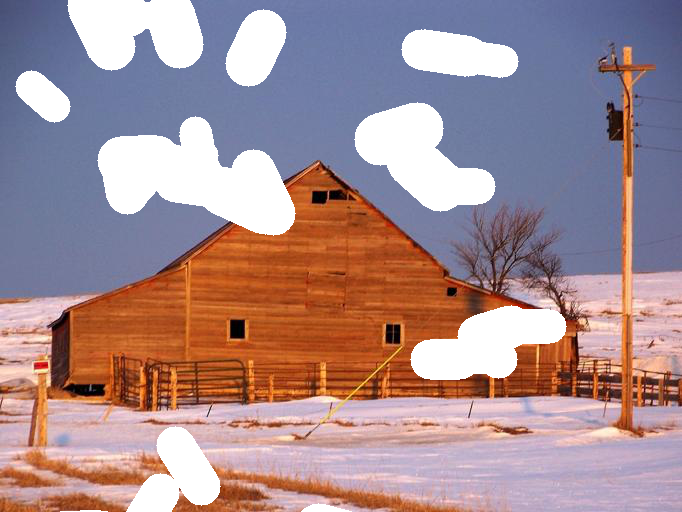

mask_shape =  (1, 512, 683)
image_toTensor shape =  torch.Size([3, 512, 683])
masked_img shape =  torch.Size([3, 512, 683])


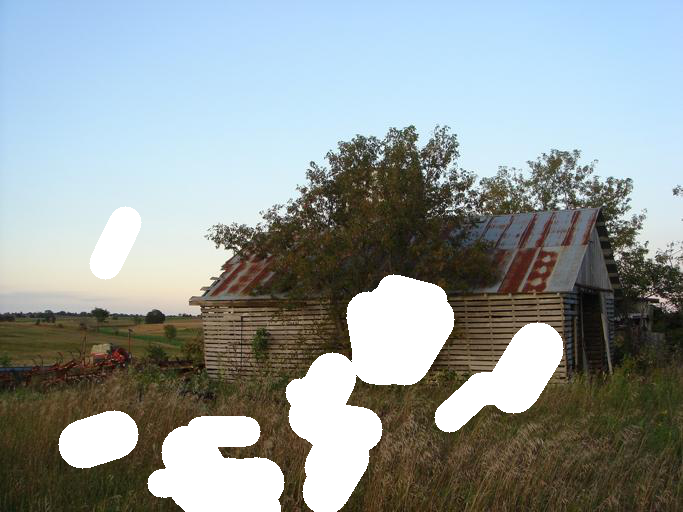

mask_shape =  (1, 512, 771)
image_toTensor shape =  torch.Size([3, 512, 771])
masked_img shape =  torch.Size([3, 512, 771])


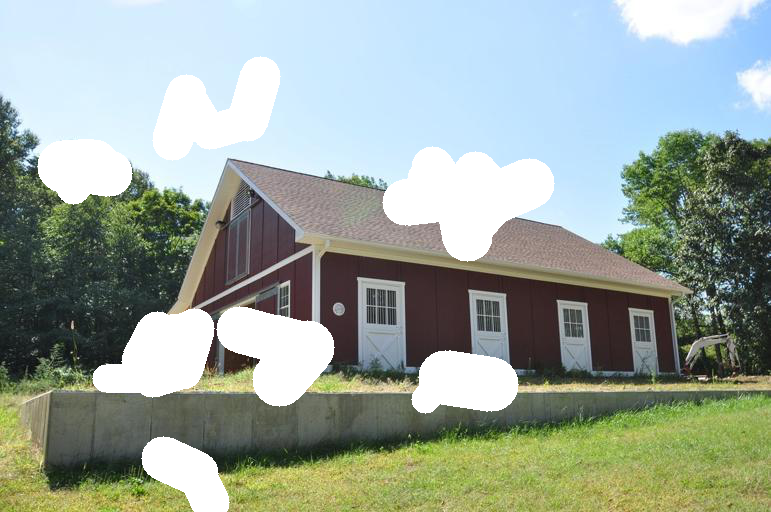

mask_shape =  (1, 512, 777)
image_toTensor shape =  torch.Size([3, 512, 777])
masked_img shape =  torch.Size([3, 512, 777])


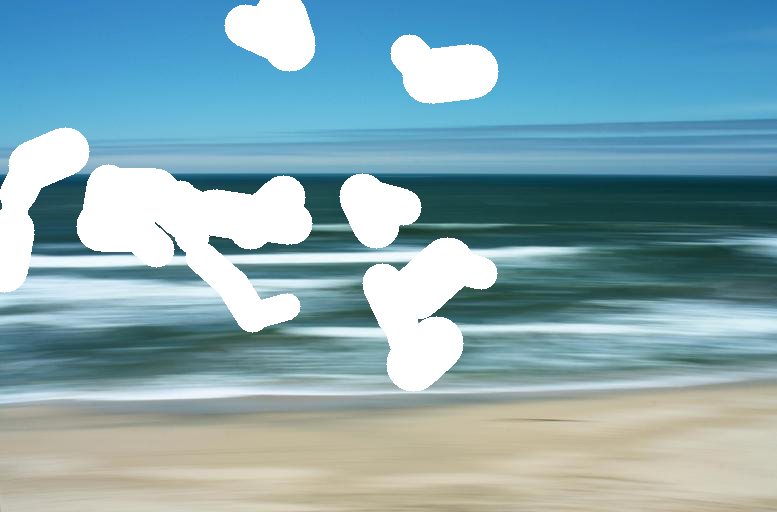

mask_shape =  (1, 512, 683)
image_toTensor shape =  torch.Size([3, 512, 683])
masked_img shape =  torch.Size([3, 512, 683])


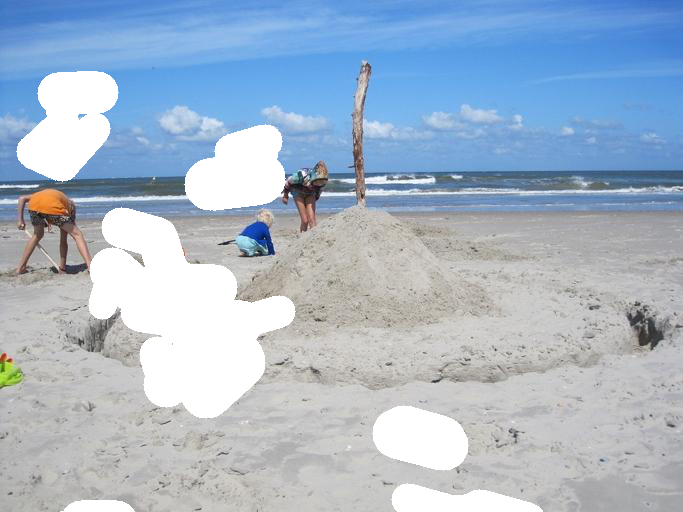

mask_shape =  (1, 512, 768)
image_toTensor shape =  torch.Size([3, 512, 768])
masked_img shape =  torch.Size([3, 512, 768])


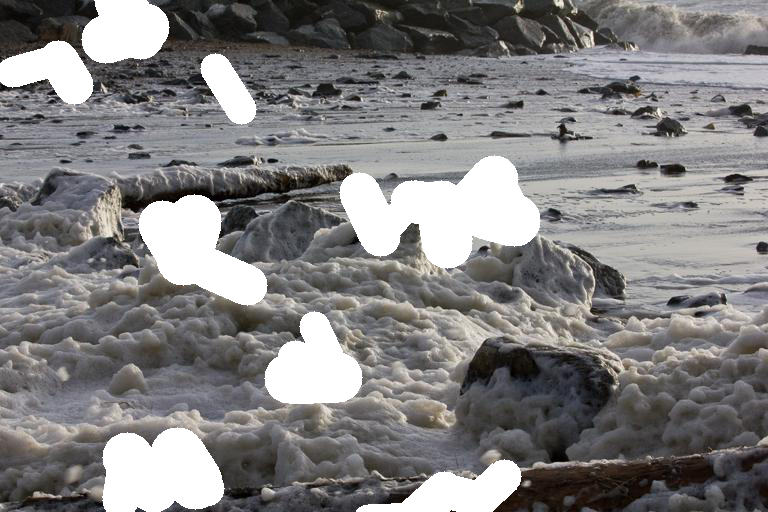

mask_shape =  (1, 512, 768)
image_toTensor shape =  torch.Size([3, 512, 768])
masked_img shape =  torch.Size([3, 512, 768])


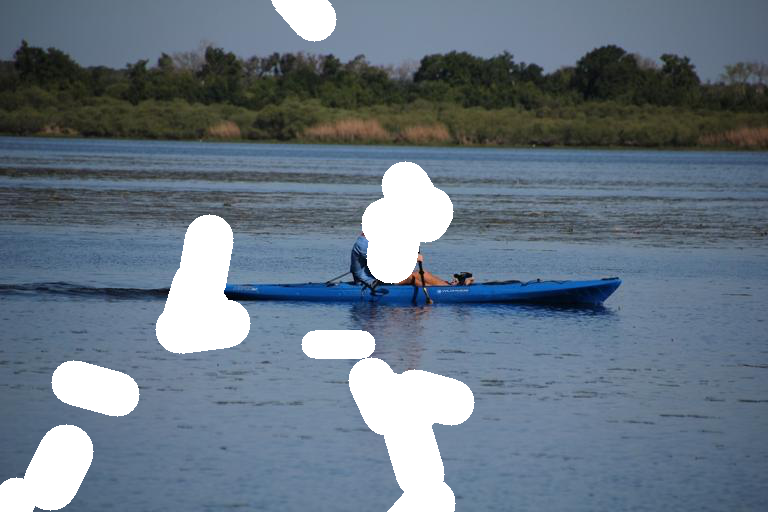

In [4]:
from inpaint.data import *
from inpaint.utils import random_ff_mask, random_bbox_mask
from PIL import Image
import argparse
from PIL import Image, ImageDraw

from torchvision import transforms
from torch.utils.data import Dataset
import torchvision
# import utils
from inpaint.utils import utils
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from time import sleep
from IPython.display import display # to display imag


def create_cfg():
    parser = argparse.ArgumentParser()
    for key, val in train_args.items():
        parser.add_argument(key, default=val)
        # print("--" + key, val)
    cfg = parser.parse_args()
    return cfg
train_args = {}

train_args["--path_dir"] = "/Users/aadit/D/cs6140/project/FinalProject/image-inpainting/samples/Places365"
train_args["--batch_size"] = 2
cfg = create_cfg()

inp = PlacesDataset(cfg)
image_lst = inp.imglist
# plt.imshow(inp.imglist[-1])
# inp.imglist
%matplotlib inline
for image in image_lst:
#     cur_img = mpimg.imread(image)
#     plt.imshow(cur_img)
#     sleep(2)
    pil_im = Image.open(image, 'r')
#     plt.imshow(np.asarray(pil_im))
    mask =  random_ff_mask(shape = (pil_im.height, pil_im.width), max_angle=10, max_len=40, max_width=50, times=15)
#     print("image shape = ",pil_im.size)
    print("mask_shape = ",mask.shape)
#     mask = transforms.ToTensor()(mask)
#     display(mask)
    pil_to_tensor = transforms.ToTensor()(pil_im) #.unsqueeze_(0)
    print("image_toTensor shape = ",pil_to_tensor.shape)     
#     display(pil_im)
    masked_img = pil_to_tensor * (1 - mask) + mask
    print("masked_img shape = ",masked_img.shape) 

    trans = transforms.ToPILImage()
#     trans(masked_img)
#     mask = torch.cat((mask, mask, mask), 1)
    display(trans(masked_img))
#     mask = torch.cat([mask,mask,mask],1)

In [ ]:
%tb

In [ ]:
# random_bbox_mask(shape, margin, bbox_shape, times)

inp = InpaintDataset("/Users/aadit/D/cs6140/project/FinalProject/image-inpainting/samples/Places365")
image_lst = inp.imglist
# plt.imshow(inp.imglist[-1])
# inp.imglist
%matplotlib inline
for image in image_lst:
#     cur_img = mpimg.imread(image)
#     plt.imshow(cur_img)
#     sleep(2)
    pil_im = Image.open(image, 'r')
#     plt.imshow(np.asarray(pil_im))
    mask =  random_bbox_mask(shape = (pil_im.height, pil_im.width), margin=(10,10), bbox_shape=(100,100), times=15)
#     print("image shape = ",pil_im.size)
#     print("mask_shape = ",mask.shape)
    pil_to_tensor = transforms.ToTensor()(pil_im) #.unsqueeze_(0)
    print("image_toTensor shape = ",pil_to_tensor.shape)     
#     display(pil_im)
    masked_img = pil_to_tensor * (1 - mask) + mask
#     print("masked_img shape = ",masked_img.shape) 
    trans = transforms.ToPILImage()
#     trans(masked_img)
#     mask = torch.cat((mask, mask, mask), 1)
    display(trans(masked_img))
#     mask = torch.cat([mask,mask,mask],1)

In [ ]:
torchvision.datasets.Places365("/Users/aadit/D/cs6140/project/FinalProject/image-inpainting/samples",
                               split='train-standard',
                               small= False, download=False,
#                                transform: Optional[Callable] = None,
#                                target_transform: Optional[Callable] = None,
#                                loader: Callable[[str], Any] = <function default_loader>
                              )

In [ ]:
from inpaint.utils import random_ff_mask, random_bbox_mask

In [ ]:
random_ff_mask(shape = (pil_im.height, pil_im.width), max_angle=10, max_len=40, max_width=50, times=15)

mask = random_ff_mask(shape=(H,W))

In [ ]:
mask = torch.cat([],1)